Note: This notebook was initially written following a tutorial from pytorch (https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html).

In [51]:
import os
import torch
import torchvision
import dataloaders
import random
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
from datetime import datetime
from tqdm import tqdm
from PIL import Image
import glob
from torchsummary import summary

In [52]:
seed = 0
random.seed(seed)
torch.manual_seed(seed)

DATA_PATH = "data/tmdb-64"
TABLE_PATH = "data/tmdb-movies-220915-clean.pkl"
workers = torch.get_num_threads()
batch_size = 64
image_size = 64
number_of_channels = 3
noise_vector_size = 100
generator_feature_maps = 64
discriminator_feature_maps = 64
num_epochs = 20
learning_rate = 0.0002
beta1 = 0.5
beta2 = 0.999
ngpu = 1
number_of_samples = 64
PADDING_MODE = "reflect"

colormode="RGB"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [53]:
dataset = dataloaders.PosterDataset(table_path=TABLE_PATH, img_root_path=DATA_PATH,
                                    img_transform=transforms.Compose([
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]),
                                    colormode=colormode,
                                    img_in_ram=False,
                                    genre=['Horror'], genre_logic='and', og_lang=None, year=None, runtime=(40,np.inf),
                                    max_num=None, sort='popularity')
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=False, num_workers=workers, pin_memory=True)

The dataset has 18119 entries.


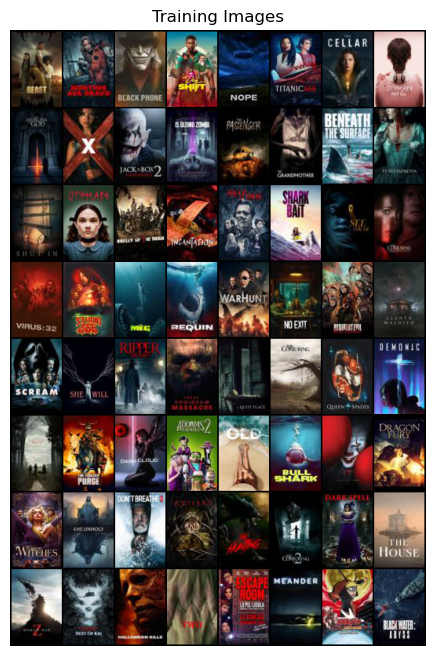

In [54]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
if colormode == "RGB":
    plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:number_of_samples], padding=2, normalize=True).cpu(),(1,2,0)))
elif colormode == "HSV":
    plt.imshow(hsv_to_rgb(np.transpose(vutils.make_grid(real_batch[0].to(device)[:number_of_samples], padding=2, normalize=True).cpu(),(1,2,0))))
else:
    print('Colormode not implemented for image visualization.')
print('The dataset has ' + str(len(dataset)) + ' entries.')

In [55]:
def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [56]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(noise_vector_size, generator_feature_maps * 8, kernel_size=(4, 4), stride=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 8, generator_feature_maps * 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 4, generator_feature_maps * 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 2, generator_feature_maps, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps, number_of_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [57]:
generator_network = Generator(ngpu).to(device)
generator_network.apply(init_weights)
print(generator_network)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [58]:
summary(generator_network, input_size=(noise_vector_size,1,1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]         819,200
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,152
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
   ConvTranspose2d-7          [-1, 128, 16, 16]         524,288
       BatchNorm2d-8          [-1, 128, 16, 16]             256
              ReLU-9          [-1, 128, 16, 16]               0
  ConvTranspose2d-10           [-1, 64, 32, 32]         131,072
      BatchNorm2d-11           [-1, 64, 32, 32]             128
             ReLU-12           [-1, 64, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           3,072
             Tanh-14            [-1, 3,

In [59]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(number_of_channels, discriminator_feature_maps, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=PADDING_MODE, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps, discriminator_feature_maps * 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=PADDING_MODE, bias=False),
            nn.BatchNorm2d(discriminator_feature_maps * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps * 2, discriminator_feature_maps * 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=PADDING_MODE, bias=False),
            nn.BatchNorm2d(discriminator_feature_maps * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps * 4, discriminator_feature_maps * 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=PADDING_MODE, bias=False),
            nn.BatchNorm2d(discriminator_feature_maps * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps * 8, 1, kernel_size=(4, 4), stride=(1, 1), bias=False),
            nn.Conv2d(1, 1, kernel_size=(3, 1), stride=(1, 1), bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [60]:
discriminator_network = Discriminator(ngpu).to(device)
discriminator_network.apply(init_weights)
print(discriminator_network)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4,

In [61]:
summary(discriminator_network, input_size=(3,96,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 48, 32]           3,072
         LeakyReLU-2           [-1, 64, 48, 32]               0
            Conv2d-3          [-1, 128, 24, 16]         131,072
       BatchNorm2d-4          [-1, 128, 24, 16]             256
         LeakyReLU-5          [-1, 128, 24, 16]               0
            Conv2d-6           [-1, 256, 12, 8]         524,288
       BatchNorm2d-7           [-1, 256, 12, 8]             512
         LeakyReLU-8           [-1, 256, 12, 8]               0
            Conv2d-9            [-1, 512, 6, 4]       2,097,152
      BatchNorm2d-10            [-1, 512, 6, 4]           1,024
        LeakyReLU-11            [-1, 512, 6, 4]               0
           Conv2d-12              [-1, 1, 3, 1]           8,192
           Conv2d-13              [-1, 1, 1, 1]               3
          Sigmoid-14              [-1, 

In [62]:
def generate_and_save_images(generator_network, epoch, noise, img_list, colormode):
  with torch.no_grad():
    images = generator_network(noise).detach().cpu()
  fig = plt.figure(figsize=(8, 8))
  plt.axis("off")
  img_list.append(vutils.make_grid(images, padding=2, normalize=True))
  if colormode == "RGB":
      plt.imshow(np.transpose(img_list[-1],(1,2,0)))
  elif colormode == "HSV":
      plt.imshow(hsv_to_rgb(np.transpose(img_list[-1],(1,2,0))))
  else:
    print('Colormode not implemented for image visualization.')
  plt.show()
  fig.savefig(output_directory + '/image_at_epoch_{:04d}.png'.format(epoch))

def save_checkpoint(generator_network, optimizer_generator, discriminator_network, optimizer_discriminator, epoch):
  torch.save({
            'epoch': epoch,
            'generator_model_state_dict': generator_network.state_dict(),
            'generator_optimizer_state_dict': optimizer_generator.state_dict(),
            'discriminator_model_state_dict': discriminator_network.state_dict(),
            'discriminator_optimizer_state_dict': optimizer_discriminator.state_dict(),
            }, output_directory + '/gan_at_epoch_{:04d}.pt'.format(epoch))

In [63]:
loss_function = nn.BCELoss()
samples_noise = torch.randn(number_of_samples, noise_vector_size, 3, 1, device=device)

optimizer_discriminator = optim.Adam(discriminator_network.parameters(), lr=learning_rate, betas=(beta1, beta2))
optimizer_generator = optim.Adam(generator_network.parameters(), lr=learning_rate, betas=(beta1, beta2))

real_label = 1.
fake_label = 0.

[0/19]	Loss_D: 0.4721	Loss_G: 3.3112	D(x): 0.6996	D(G(z)): 0.0560 / 0.0504: 100%|██████████| 284/284 [00:29<00:00,  9.63it/s]


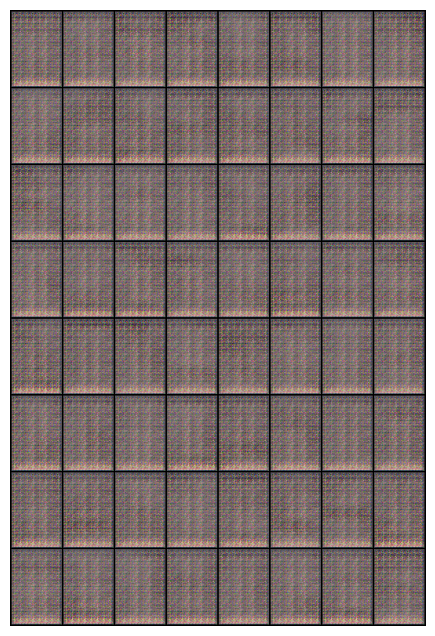

[1/19]	Loss_D: 1.7368	Loss_G: 1.5431	D(x): 0.3647	D(G(z)): 0.2453 / 0.2849: 100%|██████████| 284/284 [00:30<00:00,  9.43it/s]


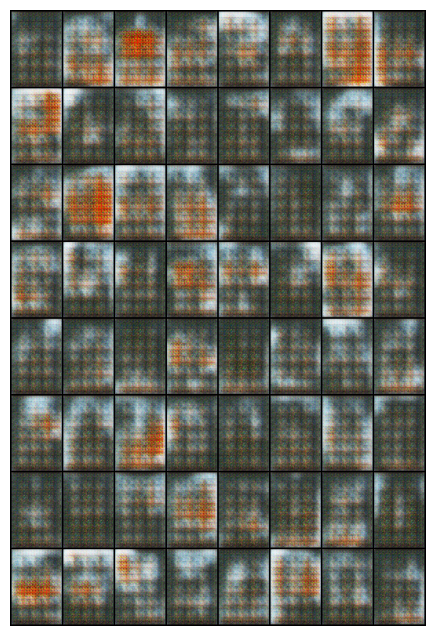

[2/19]	Loss_D: 0.4350	Loss_G: 3.6591	D(x): 0.8343	D(G(z)): 0.2074 / 0.0299: 100%|██████████| 284/284 [00:29<00:00,  9.62it/s]


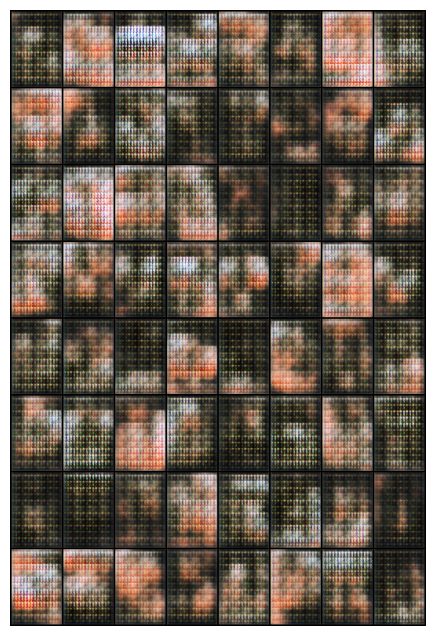

[3/19]	Loss_D: 1.0456	Loss_G: 2.9734	D(x): 0.5809	D(G(z)): 0.2880 / 0.0710: 100%|██████████| 284/284 [00:30<00:00,  9.17it/s]


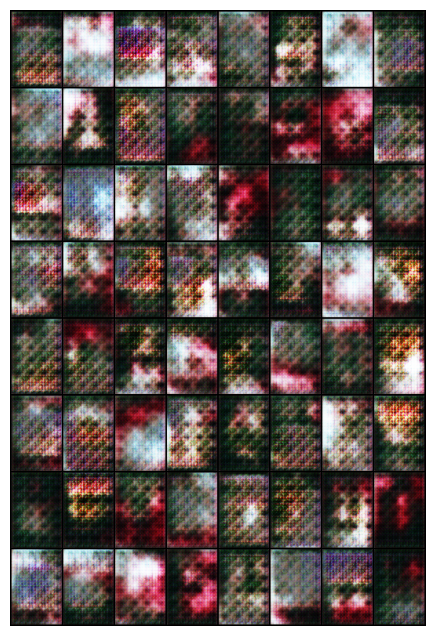

[4/19]	Loss_D: 0.9132	Loss_G: 4.4427	D(x): 0.7114	D(G(z)): 0.3639 / 0.0811: 100%|██████████| 284/284 [00:29<00:00,  9.75it/s]


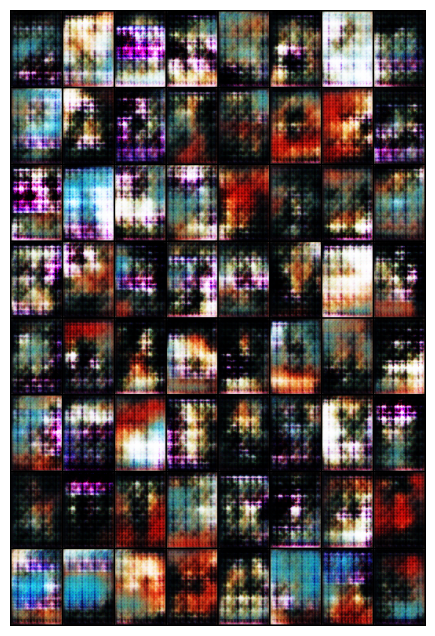

[5/19]	Loss_D: 2.1371	Loss_G: 6.8066	D(x): 0.4641	D(G(z)): 0.5028 / 0.0451: 100%|██████████| 284/284 [00:28<00:00,  9.87it/s]


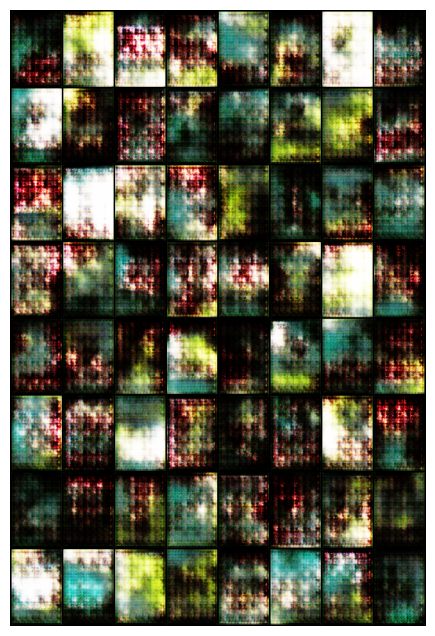

[6/19]	Loss_D: 1.4734	Loss_G: 6.0761	D(x): 0.7387	D(G(z)): 0.5160 / 0.0186: 100%|██████████| 284/284 [00:28<00:00,  9.90it/s]


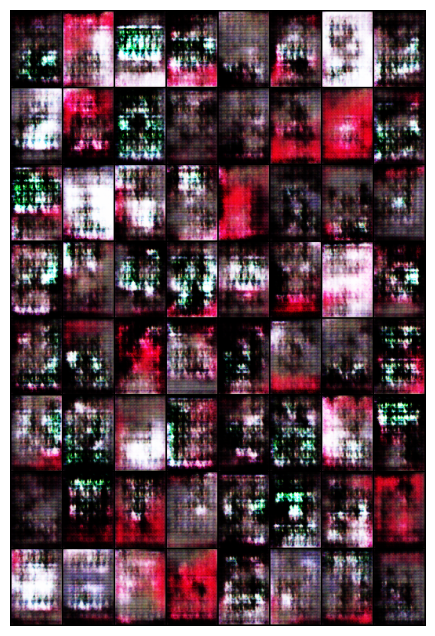

[7/19]	Loss_D: 0.9683	Loss_G: 6.5189	D(x): 0.8755	D(G(z)): 0.4768 / 0.0034: 100%|██████████| 284/284 [00:28<00:00,  9.96it/s]


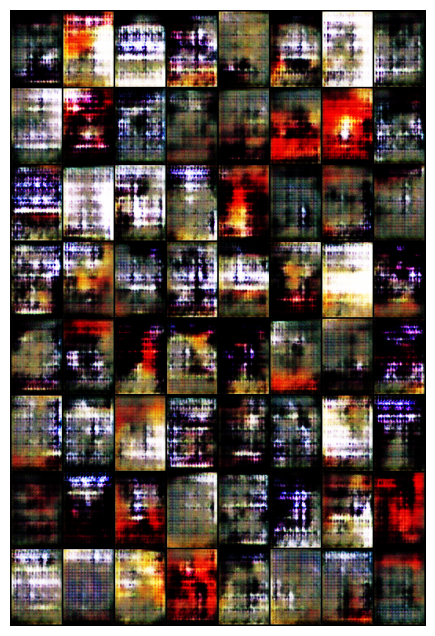

[8/19]	Loss_D: 0.3854	Loss_G: 4.1633	D(x): 0.8247	D(G(z)): 0.0910 / 0.0251: 100%|██████████| 284/284 [00:28<00:00,  9.86it/s]


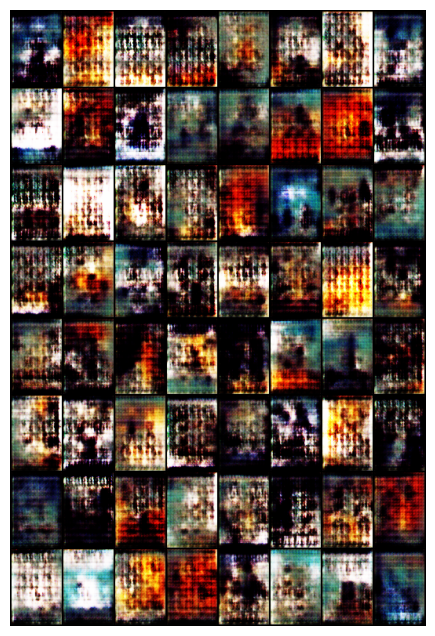

[9/19]	Loss_D: 0.4442	Loss_G: 5.8246	D(x): 0.9228	D(G(z)): 0.2817 / 0.0158: 100%|██████████| 284/284 [00:28<00:00,  9.87it/s]


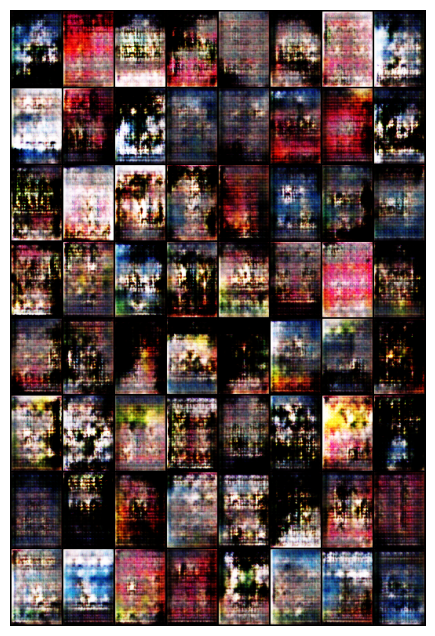

[10/19]	Loss_D: 0.2648	Loss_G: 3.8771	D(x): 0.9238	D(G(z)): 0.1463 / 0.0288: 100%|██████████| 284/284 [00:29<00:00,  9.77it/s]


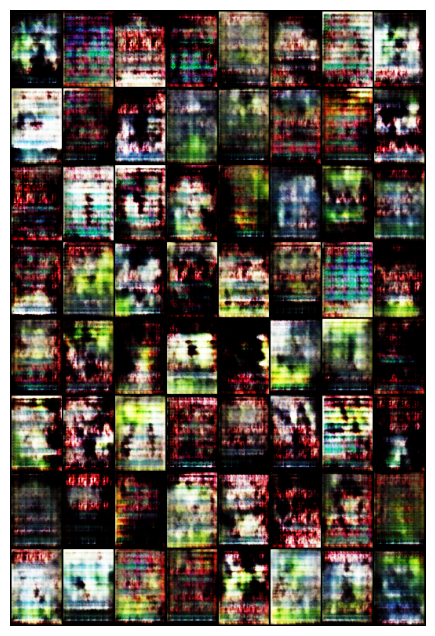

[11/19]	Loss_D: 0.8387	Loss_G: 3.8683	D(x): 0.7143	D(G(z)): 0.1879 / 0.0377: 100%|██████████| 284/284 [00:28<00:00,  9.82it/s]


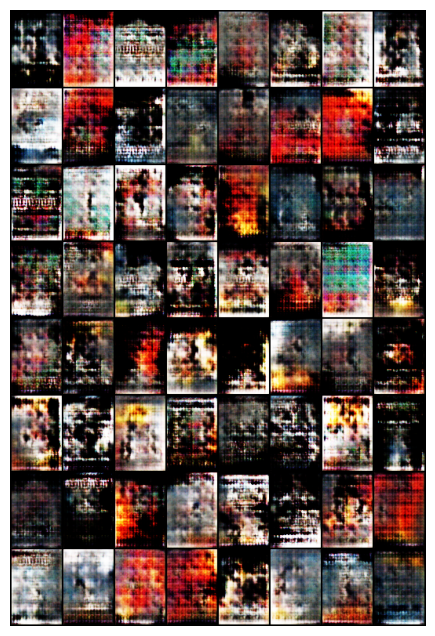

[12/19]	Loss_D: 0.4267	Loss_G: 3.2736	D(x): 0.7447	D(G(z)): 0.0307 / 0.0998: 100%|██████████| 284/284 [00:29<00:00,  9.79it/s]


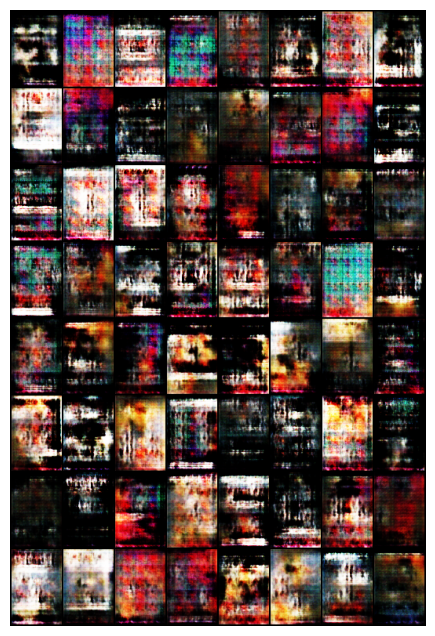

[13/19]	Loss_D: 0.4161	Loss_G: 5.6337	D(x): 0.9068	D(G(z)): 0.1846 / 0.0105: 100%|██████████| 284/284 [00:28<00:00,  9.98it/s]


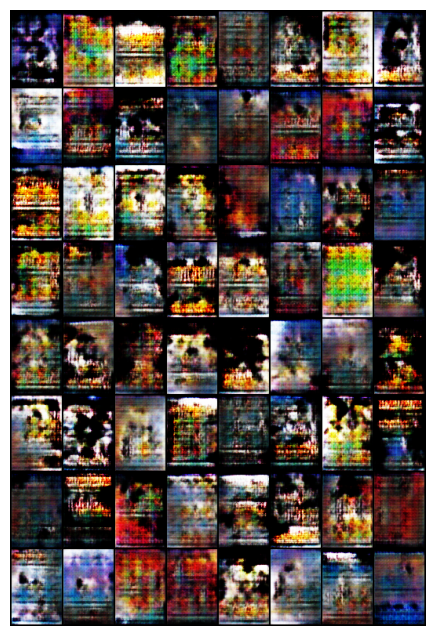

[14/19]	Loss_D: 0.1734	Loss_G: 4.4421	D(x): 0.9096	D(G(z)): 0.0561 / 0.0149: 100%|██████████| 284/284 [00:28<00:00,  9.89it/s]


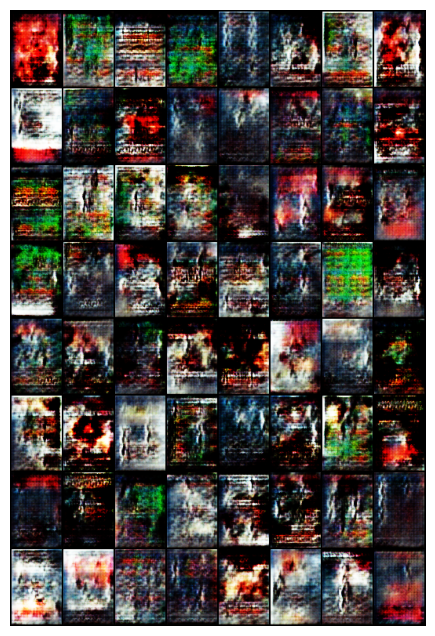

[15/19]	Loss_D: 0.5768	Loss_G: 4.5395	D(x): 0.7456	D(G(z)): 0.0354 / 0.0177: 100%|██████████| 284/284 [00:28<00:00,  9.89it/s]


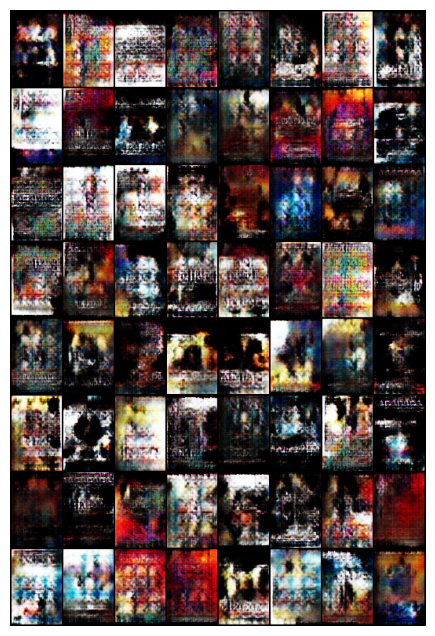

[16/19]	Loss_D: 1.1732	Loss_G: 7.8048	D(x): 0.8138	D(G(z)): 0.5948 / 0.0029: 100%|██████████| 284/284 [00:28<00:00,  9.89it/s]


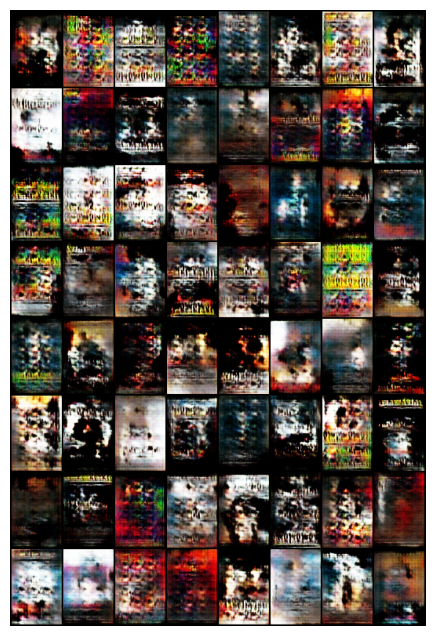

[17/19]	Loss_D: 0.4552	Loss_G: 5.9405	D(x): 0.9238	D(G(z)): 0.2991 / 0.0060: 100%|██████████| 284/284 [00:28<00:00,  9.95it/s]


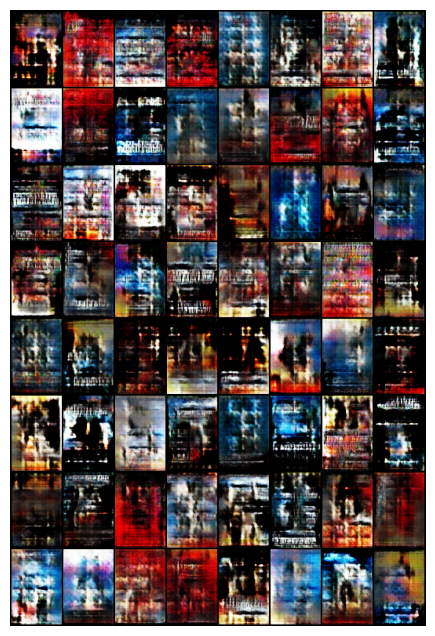

[18/19]	Loss_D: 0.3322	Loss_G: 5.0324	D(x): 0.8643	D(G(z)): 0.1580 / 0.0089: 100%|██████████| 284/284 [00:28<00:00,  9.80it/s]


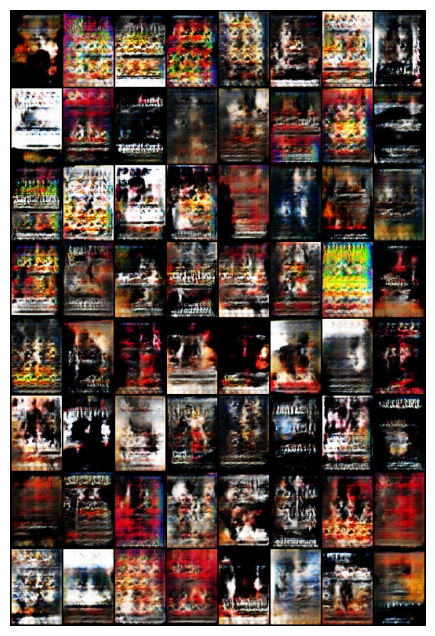

[19/19]	Loss_D: 0.7311	Loss_G: 2.1716	D(x): 0.5099	D(G(z)): 0.0064 / 0.1637: 100%|██████████| 284/284 [00:28<00:00,  9.89it/s]


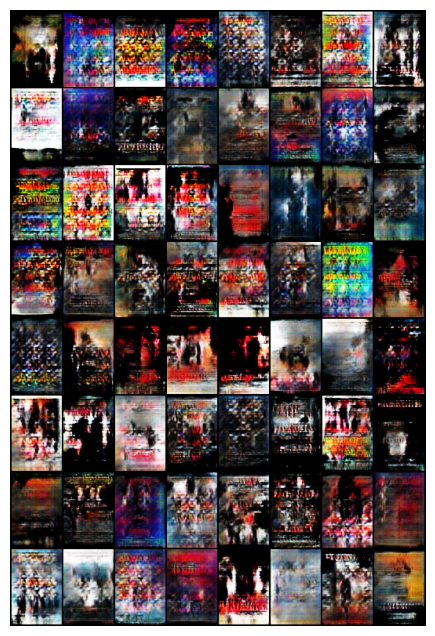

In [64]:
output_directory = os.path.join(os.getcwd(), 'dcgan-output', datetime.now().strftime('%Y-%m-%d_%H-%M-%S'))
os.makedirs(output_directory)

img_list = []
generator_losses = []
discriminator_losses = []
current_iteration = 0

for epoch in range(num_epochs):
    for i, data in enumerate(pbar := tqdm(dataloader)):

        # Train Discriminator
        discriminator_network.zero_grad()
        real = data[0].to(device)
        label = torch.full((real.size(0),), real_label, dtype=torch.float, device=device)
        output = discriminator_network(real).view(-1)
        discriminator_error_on_real = loss_function(output, label)
        discriminator_error_on_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(real.size(0), noise_vector_size, 3, 1, device=device)
        fake = generator_network(noise)
        label.fill_(fake_label)
        output = discriminator_network(fake.detach()).view(-1)
        discriminator_error_on_fake = loss_function(output, label)
        discriminator_error_on_fake.backward()
        D_G_z1 = output.mean().item()
        discriminator_error = discriminator_error_on_real + discriminator_error_on_fake
        optimizer_discriminator.step()

        # Train Generator
        generator_network.zero_grad()
        label.fill_(real_label)
        output = discriminator_network(fake).view(-1)
        generator_error = loss_function(output, label)
        generator_error.backward()
        D_G_z2 = output.mean().item()
        optimizer_generator.step()

        pbar.set_description('[%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f' % (epoch, num_epochs-1, discriminator_error.item(), generator_error.item(), D_x, D_G_z1, D_G_z2))
        generator_losses.append(generator_error.item())
        discriminator_losses.append(discriminator_error.item())

        current_iteration += 1

    generate_and_save_images(generator_network, epoch, samples_noise, img_list, colormode)
    save_checkpoint(generator_network, optimizer_generator, discriminator_network, optimizer_discriminator, epoch)

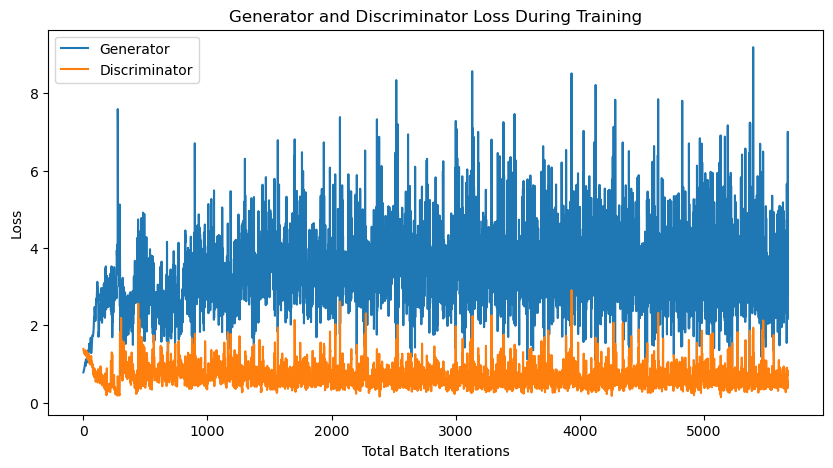

In [65]:
fig = plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(generator_losses,label="Generator")
plt.plot(discriminator_losses,label="Discriminator")
plt.xlabel("Total Batch Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
fig.savefig(f"{output_directory}/training_loss.png")

In [66]:
sample_images = [Image.open(image) for image in glob.glob(f"{output_directory}/image*.png")]
thumbnail = sample_images[0]
thumbnail.save(f"{output_directory}/dcgan.gif", format="GIF", append_images=sample_images, save_all=True, duration=1000, loop=0)

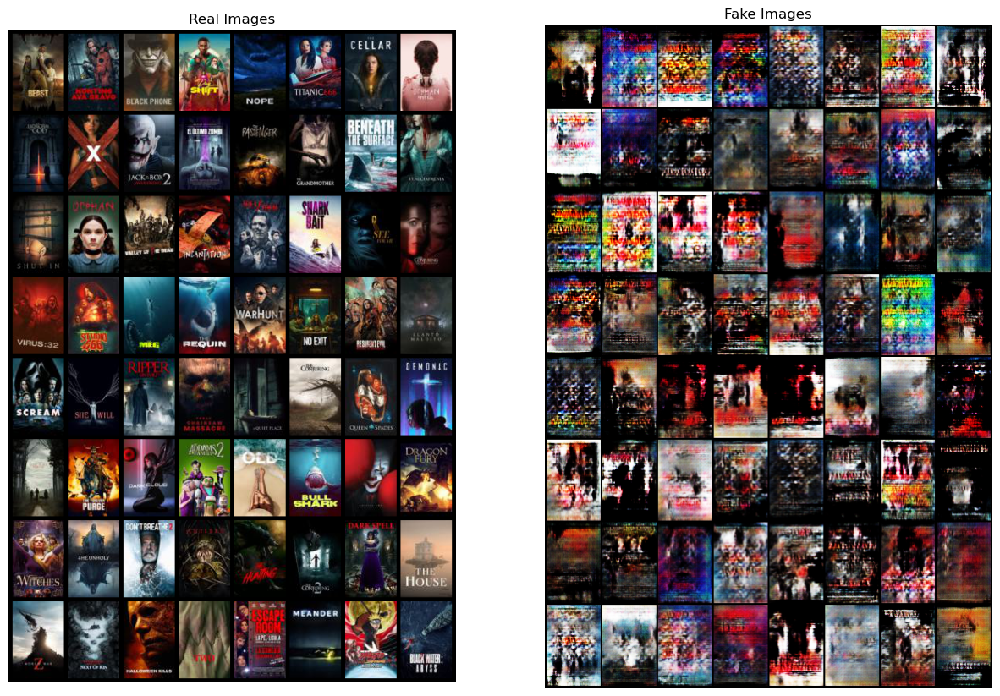

In [67]:
real = next(iter(dataloader))

fig = plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:number_of_samples], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

fig.savefig(f"{output_directory}/real_vs_fake.png")